# Сравнение различных моделей кластеризации

Случай, когда оптимальное число кластеров подбирается для каждой модели независимо.


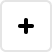
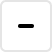
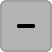
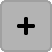
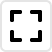
...
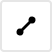
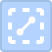
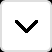
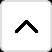
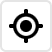

In [1]:
from itertools import product
from collections import namedtuple

import pandas as pd
from sklearn.metrics import mean_squared_error as error_metric

from lets_plot import *
from lets_plot.mapping import as_discrete
LetsPlot.setup_html()

import os; import sys; sys.path.append(os.path.join(sys.path[0], ".."))
from util import util as u
from util import font as ufont
from util import clustering_model as ucm
from util import transform_data as utd

In [2]:
FAST_RUN = False
N_CLUSTERS_MIN, N_CLUSTERS_MAX = (1, 4) if FAST_RUN else (1, 10)

In [3]:
def calc_char_general_orders(df, *, name="general_order"):
    result_s = utd.calc_char_orders(df).loc["order"]
    result_s.name = name
    return result_s

def calc_char_mean_orders(df, *, font_cols=["font_family", "font_size", "font_face"], name="mean_order"):
    result_s = utd.calc_char_orders(df, font_cols=font_cols).mean()
    result_s.name = name
    return result_s

def prepare_extended_char_data(cw_df, full_cw_df, t_s):
    c_data = ucm.prepare_char_data(cw_df, t_s)
    general_order_s = calc_char_general_orders(full_cw_df)
    mean_order_s = calc_char_mean_orders(cw_df, font_cols=["font_family"])
    general_mean_order_s = calc_char_mean_orders(full_cw_df, name="general_mean_order")
    return pd.concat([c_data, general_order_s, mean_order_s, general_mean_order_s], axis="columns")

def get_min_scored_cluster(df, *, min_coeff=2.0/3.0, model_col="model", n_clusters_col="n_clusters", score_col="score"):
    def calc_min_scored_cluster(r):
        min_value = r.max()
        for v in r.values:
            if v < min_coeff * min_value:
                min_value = v
        return min_value
    replace_s = df.sort_values(by=n_clusters_col).groupby(model_col)[score_col].agg(calc_min_scored_cluster)
    return df.score == df[model_col].replace(replace_s)

In [4]:
ModelType = namedtuple("ModelType", ["name", "clustering_col", "calc_cluster_size_method", "admixture_col"])

clustering_cols = ["width", "order", "general_order", "mean_order", "general_mean_order"]
calc_cluster_size_methods = [
    ("non_weighted", lambda r: r.width.mean()),
    ("weighted", None),
]
admixture_cols = [
    ("non_admixtured", None),
    ("admixtured", "alphabet"),
]

model_types = [
    ModelType("clustered_by_{0}-{1}-{2}".format(t[0], t[1][0], t[2][0]), t[0], t[1][1], t[2][1])
    for t in product(clustering_cols, calc_cluster_size_methods, admixture_cols)
]
if FAST_RUN:
    model_types = model_types[:8]
print("Model types:\n\t{0}".format("\n\t".join([model_type.name for model_type in model_types])))

Model types:
	clustered_by_width-non_weighted-non_admixtured
	clustered_by_width-non_weighted-admixtured
	clustered_by_width-weighted-non_admixtured
	clustered_by_width-weighted-admixtured
	clustered_by_order-non_weighted-non_admixtured
	clustered_by_order-non_weighted-admixtured
	clustered_by_order-weighted-non_admixtured
	clustered_by_order-weighted-admixtured
	clustered_by_general_order-non_weighted-non_admixtured
	clustered_by_general_order-non_weighted-admixtured
	clustered_by_general_order-weighted-non_admixtured
	clustered_by_general_order-weighted-admixtured
	clustered_by_mean_order-non_weighted-non_admixtured
	clustered_by_mean_order-non_weighted-admixtured
	clustered_by_mean_order-weighted-non_admixtured
	clustered_by_mean_order-weighted-admixtured
	clustered_by_general_mean_order-non_weighted-non_admixtured
	clustered_by_general_mean_order-non_weighted-admixtured
	clustered_by_general_mean_order-weighted-non_admixtured
	clustered_by_general_mean_order-weighted-admixtured


In [5]:
full_char_widths_df = u.read_data("../data/full/char_widths.csv", monospaced=False)
char_widths_df = utd.filter_by_font(full_char_widths_df, filters=["size", "face"])
char_widths_df = utd.narrow_by_column(char_widths_df, "font_family", values=ufont.TRAIN_FONT_FAMILIES)
print(char_widths_df.shape)
char_widths_df.head()

(4944, 5)


,char_id,char,alphabet,font_family,width
0,32,,latin,Geneva,5
1,33,!,latin,Geneva,6
2,34,"""",latin,Geneva,7
3,35,#,latin,Geneva,11
4,36,$,latin,Geneva,11


In [6]:
full_control_df = u.read_data("../data/full/control.csv", monospaced=False)
control_df = utd.filter_by_font(full_control_df, filters=["size", "face"])
control_df = utd.narrow_by_column(control_df, "text", frac=(.02 if FAST_RUN else .1))
train_control_df, test_control_df = utd.train_test_split_by_column(
    control_df,
    "font_family",
    train_values=ufont.TRAIN_FONT_FAMILIES
)
print("control_df.shape={0}".format(control_df.shape))
print("train_control_df.shape={0}".format(train_control_df.shape))
print("test_control_df.shape={0}".format(test_control_df.shape))
control_df.head()

control_df.shape=(980, 5)
train_control_df.shape=(588, 5)
test_control_df.shape=(392, 5)


,text,width,alphabet,font_family,symbols_count
0,7,11,latin,Geneva,1
1,fill,18,latin,Geneva,4
2,-1.0,33,latin,Geneva,4
3,alpha,45,latin,Geneva,5
4,height,51,latin,Geneva,6


In [7]:
full_texts_df = u.read_data("../data/full/texts.csv", monospaced=False)
texts_df = full_texts_df[["text", "alphabet"]].drop_duplicates()
print(texts_df.shape)
texts_df.head()

(1033, 2)


,text,alphabet
0,x,latin
1,y,latin
2,z,latin
3,0,latin
4,1,latin


In [8]:
char_df = pd.concat([
    prepare_extended_char_data(
        char_widths_df[char_widths_df.alphabet == alphabet],
        full_char_widths_df[full_char_widths_df.alphabet == alphabet],
        texts_df[texts_df.alphabet == alphabet].text
    ).assign(alphabet=lambda r: alphabet)
    for alphabet in char_widths_df.alphabet.unique()
])
print(char_df.shape)
char_df.head()

(824, 7)


,width,weight,order,general_order,mean_order,general_mean_order,alphabet
char,,,,,,,
,5.333333,813,11,0,13.166667,4.529167,latin
!,6.166667,1,28,13,26.333333,16.741667,latin
"""",7.666667,1,61,69,73.666667,78.929167,latin
#,11.833333,1,224,223,218.833333,180.066667,latin
$,11.000000,1,194,139,176.500000,132.966667,latin


In [9]:
clusters_df = pd.DataFrame(columns=["model", "n_clusters", "score"])
for model_type in model_types:
    for n_clusters in range(N_CLUSTERS_MIN, N_CLUSTERS_MAX + 1):
        model = ucm.ClusteringModel(
            clustering_col=model_type.clustering_col,
            calc_cluster_size=model_type.calc_cluster_size_method,
            n_clusters=n_clusters, random_state=42
        ).fit(char_df, admixture_col=model_type.admixture_col)
        clusters_df = pd.concat([clusters_df, pd.DataFrame({
            "model": [model_type.name],
            "n_clusters": [n_clusters],
            "score": [error_metric(train_control_df.width, model.predict(train_control_df.text))],
        })], ignore_index=True)
clusters_df["is_min_scored"] = get_min_scored_cluster(clusters_df)
clusters_df["color"] = clusters_df.is_min_scored.replace({True: "#e41a1c", False: "#377eb8"})
print(clusters_df.shape)
clusters_df.head()

(200, 5)


,model,n_clusters,score,is_min_scored,color
0,clustered_by_width-non_weighted-non_admixtured,1,2862.069728,False,#377eb8
1,clustered_by_width-non_weighted-non_admixtured,2,337.239796,False,#377eb8
2,clustered_by_width-non_weighted-non_admixtured,3,358.406463,False,#377eb8
3,clustered_by_width-non_weighted-non_admixtured,4,186.981293,True,#e41a1c
4,clustered_by_width-non_weighted-non_admixtured,5,167.328231,False,#377eb8


In [10]:
ggplot(clusters_df) + \
    geom_errorbar(aes(x=as_discrete("n_clusters", order=1), ymax="score", color="color"), \
                  ymin=0, show_legend=False) + \
    facet_wrap(facets="model", ncol=2) + \
    scale_color_identity() + \
    ylab("score") + \
    ggtitle("Зависимость ошибки предсказания от количества кластеров для разных моделей")

In [11]:
model_test_dfs = []
for model_type in model_types:
    best_n_clusters = clusters_df[(clusters_df.model == model_type.name)&(clusters_df.is_min_scored)].iloc[0].n_clusters
    model = ucm.ClusteringModel(
        clustering_col=model_type.clustering_col,
        calc_cluster_size=model_type.calc_cluster_size_method,
        n_clusters=best_n_clusters, random_state=42
    ).fit(char_df, admixture_col=model_type.admixture_col)
    model_test_dfs.append(
        test_control_df.assign(
            model=model_type.name,
            predicted_width=model.predict(test_control_df.text),
        )
    )
    predictor = model.predictor
    print("\n\nModel {0}:".format(model_type.name))
    for cluster in predictor.cluster.sort_values().unique():
        print("\tCluster #{0}:".format(cluster))
        print("\t\tWidth: {0}".format(predictor[predictor.cluster == cluster].iloc[0].cluster_width))
        print("\t\tChars with positive weight: {0}".format(
            list(predictor[(predictor.cluster == cluster)&(predictor.weight > 1)].index)
        ))
test_df = pd.concat(model_test_dfs)
test_df["prediction_error"] = test_df.predicted_width - test_df.width
test_df["prediction_mean_error"] = test_df.prediction_error / test_df.symbols_count
print(test_df.shape)
test_df.head()



Model clustered_by_width-non_weighted-non_admixtured:
	Cluster #0:
		Width: 6.298780487804878
		Chars with positive weight: [' ', 'ï', 'î', 'Í', 't', 'r', 'l', 'j', 'i', 'г', 'т', 'f', '.', 'I', "'", '-']
	Cluster #1:
		Width: 10.591156462585033
		Chars with positive weight: ['0', 'b', '1', '5', '6', '7', '8', '9', 'a', '2', '3', '4', 'Г', 'З', 'К', 'Р', 'Т', 'У', 'а', 'б', 'в', 'д', 'е', 'Б', 'з', 'и', 'й', 'ё', 'я', 'к', 'л', 'н', 'о', 'п', 'р', 'с', 'у', 'ц', 'ч', 'ъ', 'ь', 'э', 'х', 'F', 'ç', 'Y', 'Z', 'z', 'y', 'è', 'é', 'ê', 'x', 'ñ', 'ó', 'ô', 'u', 'ú', 'û', 's', 'v', 'L', 'J', 'P', 'T', 'á', 'â', 'q', 'g', 'e', 'o', 'p', 'c', 'n', 'h', 'k', 'd']
	Cluster #2:
		Width: 13.848128807658833
		Chars with positive weight: ['Э', 'ж', 'Я', 'ы', 'щ', 'ш', 'ф', 'м', 'Л', 'А', 'В', 'Д', 'Ф', 'С', 'П', 'О', 'Н', 'И', 'Е', 'Ч', 'ю', 'À', 'w', 'V', 'U', 'S', 'R', 'Q', 'O', 'N', 'H', 'G', 'E', 'D', 'C', 'B', 'A', 'É']
	Cluster #3:
		Width: 17.811403508771928
		Chars with positive weight: ['m



Model clustered_by_general_order-non_weighted-non_admixtured:
	Cluster #0:
		Width: 10.032915360501567
		Chars with positive weight: [' ', 'б', 'а', 'Э', 'Ч', 'У', 'Т', 'С', 'Р', 'К', 'в', 'З', 'Г', 'В', 'Б', 'А', 'Е', 'г', 'е', 'ё', 'я', 'э', 'ь', 'ъ', 'ч', 'ц', 'х', 'у', 'д', 'т', 'р', 'п', 'о', 'н', 'м', 'л', 'к', 'й', 'и', 'з', 'с', 'e', 'J', 'I', 'ó', 'ô', '9', 'ç', 'è', 'é', 'y', '8', 'ê', 'x', 'v', 'u', 't', 's', 'r', 'o', 'n', 'l', 'k', 'a', 'b', 'ï', 'f', 'î', 'h', 'i', 'j', 'c', 'û', 'z', '0', '.', '1', '-', 'á', 'Í', '2', '6', '5', '4', '3', 'â', "'"]
	Cluster #1:
		Width: 13.85084925690021
		Chars with positive weight: ['ф', 'À', 'ж', 'É', 'Я', 'Ю', 'Ф', 'ш', 'щ', 'Д', 'Ж', 'И', 'Л', 'М', 'Н', 'О', 'ю', 'П', 'ы', '7', 'A', 'B', 'd', 'g', 'p', 'q', 'Z', 'Y', 'E', 'F', 'L', 'P', 'S', 'T', 'ñ', 'ú']
	Cluster #2:
		Width: 15.162303664921465
		Chars with positive weight: ['H', 'G', 'C', 'D', 'w', 'W', 'V', 'U', 'Q', 'O', 'N', 'M', 'R', 'm']


Model clustered_by_general_order-n



Model clustered_by_mean_order-weighted-admixtured:
	Cluster #0-0:
		Width: 5.7026256034499205
		Chars with positive weight: [' ', 'Í', 't', 'v', 'x', 'y', 'z', 's', 'á', 'â', 'ç', 'î', 'ï', 'r', 'c', '-', '.', 'a', "'", 'j', 'k', 'i', 'l', 'f', 'I', 'J']
	Cluster #0-1:
		Width: 10.681011772454104
		Chars with positive weight: ['h', 'n', 'o', 'p', 'q', 'u', 'g', 'e', 'd', 'b', '0', '1', '2', '3', '4', '5', '6', '8', '9', 'L', '7', 'ô', 'ó', 'è', 'é', 'û', 'ñ', 'ê', 'ú']
	Cluster #0-2:
		Width: 13.079228243021346
		Chars with positive weight: ['w', 'S', 'B', 'C', 'R', 'T', 'P', 'N', 'H', 'A', 'Z', 'Y', 'V', 'U', 'E', 'É', 'F', 'À']
	Cluster #0-3:
		Width: 16.052393857271905
		Chars with positive weight: ['D', 'm', 'M', 'O', 'Q', 'W', 'G']
	Cluster #1-0:
		Width: 10.227955227955228
		Chars with positive weight: ['р', 'к', 'л', 'н', 'о', 'п', 'с', 'т', 'у', 'х', 'ц', 'ч', 'ъ', 'ь', 'э', 'й', 'з', 'У', 'Р', 'Л', 'К', 'З', 'Е', 'Г', 'а', 'Б', 'б', 'в', 'г', 'д', 'е', 'и', 'я', 'Т', 'ё']
	C

,text,width,alphabet,font_family,symbols_count,model,predicted_width,prediction_error,prediction_mean_error
0,7,11,latin,Arial,1,clustered_by_width-non_weighted-non_admixtured,11,0,0.000000
1,fill,18,latin,Arial,4,clustered_by_width-non_weighted-non_admixtured,25,7,1.750000
2,-1.0,33,latin,Arial,4,clustered_by_width-non_weighted-non_admixtured,34,1,0.250000
3,alpha,45,latin,Arial,5,clustered_by_width-non_weighted-non_admixtured,49,4,0.800000
4,height,51,latin,Arial,6,clustered_by_width-non_weighted-non_admixtured,55,4,0.666667


In [12]:
ggplot(test_df) + \
    geom_hline(yintercept=0, color="black") + \
    geom_point(aes("symbols_count", "prediction_error", color="font_family")) + \
    geom_smooth(aes("symbols_count", "prediction_error", color="font_family")) + \
    facet_grid(x="alphabet", y="model") + \
    ggtitle("Зависимость абсолютной ошибки от количества символов") + \
    theme(strip_text=element_text(size=8))

Если точки одного цвета хотя бы выстраиваются в прямую линию - ошибку можно контролировать.

В идеале - точки должны быть близки к оси `y = 0` (черная линия).

In [13]:
ggplot(test_df) + \
    geom_vline(xintercept=0, color="black") + \
    geom_density(aes(x="prediction_mean_error", color="font_family"), size=2) + \
    facet_grid(x="alphabet", y="model") + \
    ggtitle("Плотность распределения средней ошибки") + \
    theme(strip_text=element_text(size=8))

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.


Если все кривые имеют форму колокола - это уже неплохо, значит ошибки распределены нормально, и их можно контролировать (например, растягивать или сдвигать предсказание для данного шрифта).

Чем выше колокол - тем лучше, значит ошибки имеют небольшой разброс.

Чем колокол ближе к `0` - тем лучше тоже, значит ошибка не будет слишком сильно расти при увеличении длины текста.